In [1]:
# imports and config
import cv2
import numpy as np
from pathlib import Path
from collections import defaultdict
from matplotlib import pyplot as plt

DATA_ROOT = Path('trafficnet_dataset_v1')
CLASSES = ['accident', 'dense_traffic', 'fire', 'sparse_traffic']


In [2]:
# feature extraction
def extract_features(img):
    img = cv2.resize(img, (400, 400))
    vis = img.copy()
    
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    fire_mask = cv2.inRange(hsv, np.array([0, 150, 100]), np.array([20, 255, 255]))
    fire_ratio = np.sum(fire_mask) / (img.size / 3)
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    edges = cv2.Canny(blur, 50, 150)
    
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    vehicle_count = 0
    for cnt in contours:
        if cv2.contourArea(cnt) > 100:
            vehicle_count += 1
            cv2.drawContours(vis, [cnt], -1, (0,255,0), 2)
    
    cv2.putText(vis, f"Fire: {fire_ratio:.2f}", (10, 30), 
               cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,255), 2)
    cv2.putText(vis, f"Vehicles: {vehicle_count}", (10, 70), 
               cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,0), 2)
    
    return {
        'fire_ratio': fire_ratio,
        'vehicle_count': vehicle_count,
        'edge_density': np.sum(edges)/edges.size,
        'visualization': vis
    }


In [3]:
# predictions
def show_results(img, true_class, pred_class, features):
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    display_img = img.copy()
    cv2.putText(display_img, f"True: {true_class}", (10, 30), 
               cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
    cv2.putText(display_img, f"Pred: {pred_class}", (10, 70), 
               cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 200, 255), 2)
    plt.imshow(cv2.cvtColor(display_img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(features['visualization'], cv2.COLOR_BGR2RGB))
    plt.title("Feature Analysis")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()


Traffic Incident Classification

Thresholds:
Fire ratio: 7.76
Dense vehicles: 15
Sparse vehicles: 3

accident:
Fire ratio: 6.77
Vehicles: 18
Prediction: dense_traffic (Wrong)


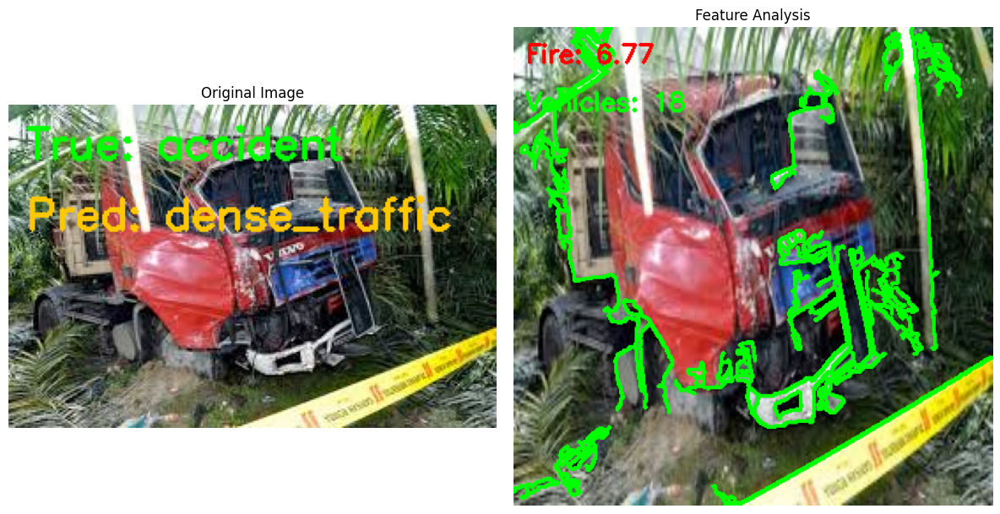


accident:
Fire ratio: 19.69
Vehicles: 8
Prediction: fire (Wrong)


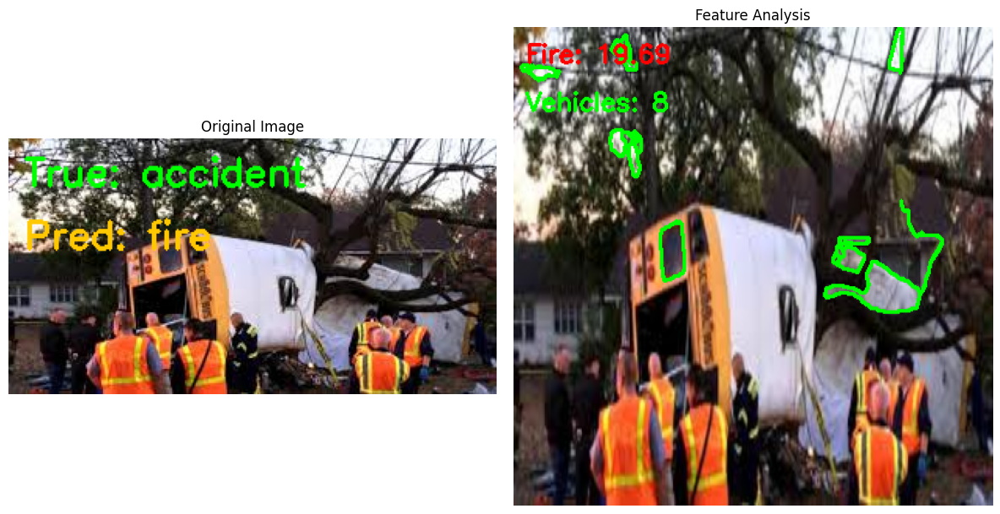


accident:
Fire ratio: 0.47
Vehicles: 7
Prediction: sparse_traffic (Wrong)


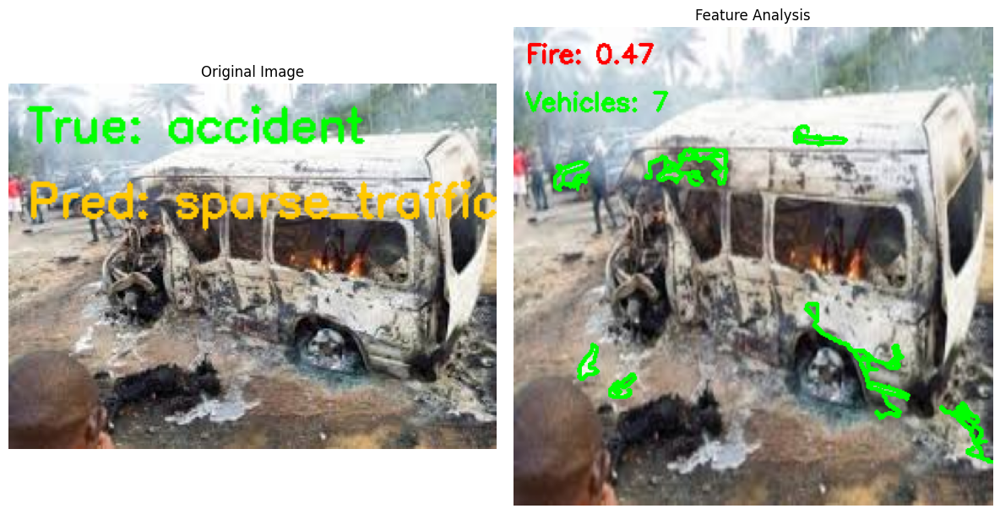


dense_traffic:
Fire ratio: 2.74
Vehicles: 10
Prediction: sparse_traffic (Wrong)


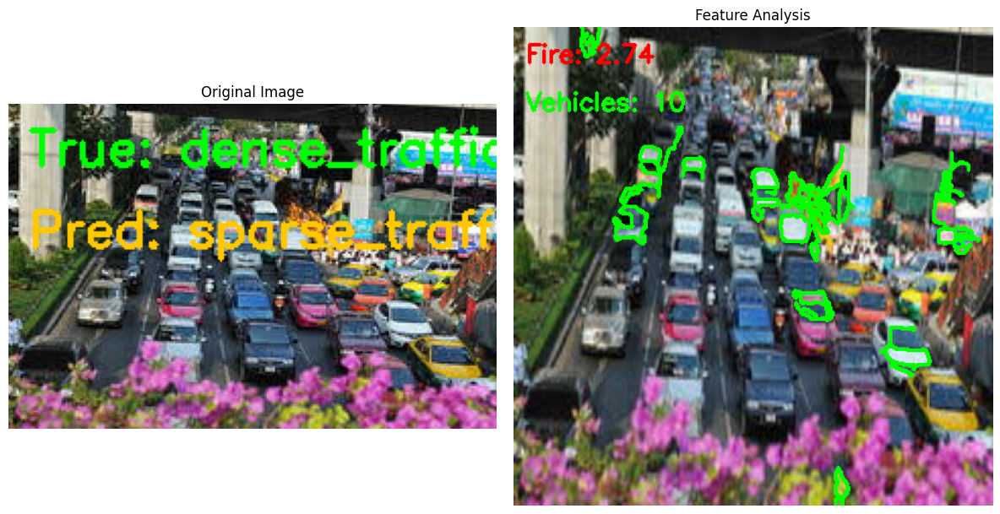


dense_traffic:
Fire ratio: 0.32
Vehicles: 18
Prediction: dense_traffic (Correct)


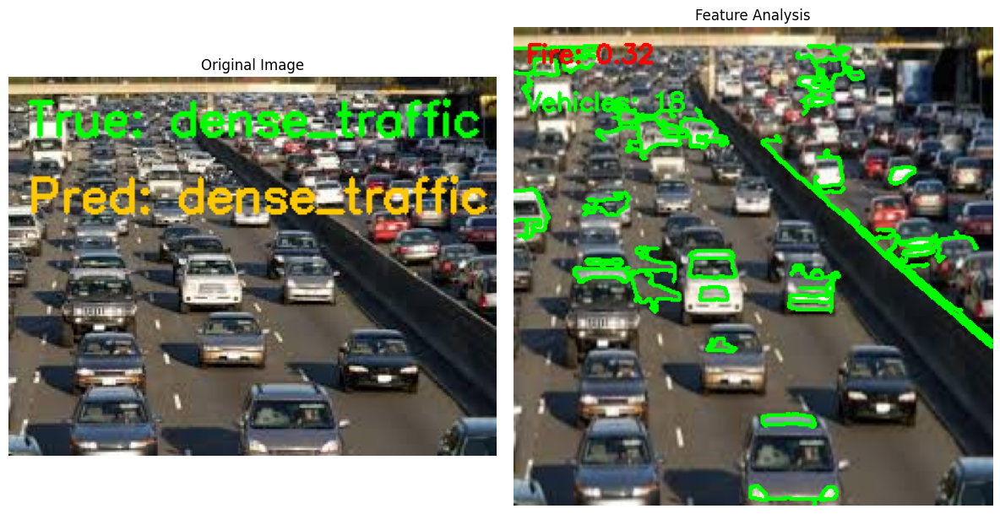


dense_traffic:
Fire ratio: 14.91
Vehicles: 7
Prediction: fire (Wrong)


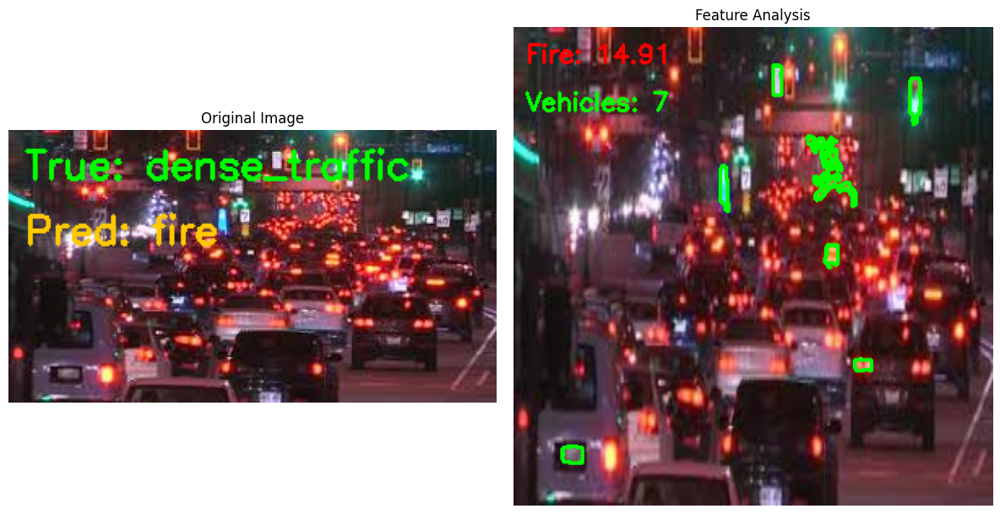


fire:
Fire ratio: 0.96
Vehicles: 1
Prediction: accident (Wrong)


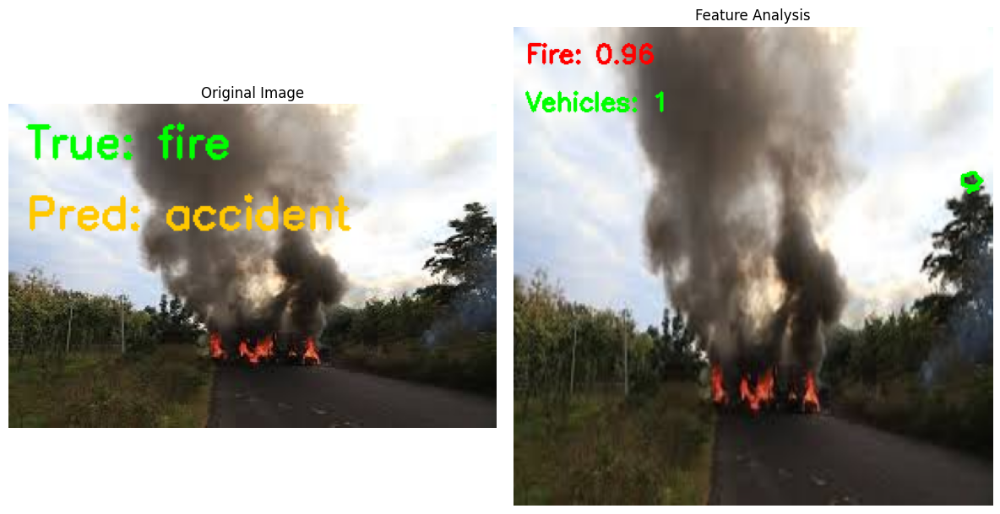


fire:
Fire ratio: 52.90
Vehicles: 5
Prediction: fire (Correct)


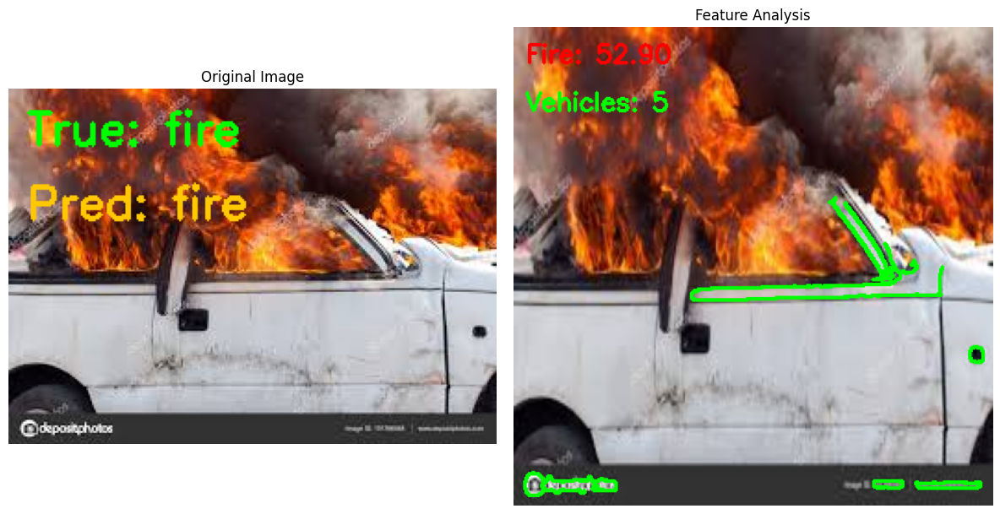


fire:
Fire ratio: 0.41
Vehicles: 6
Prediction: sparse_traffic (Wrong)


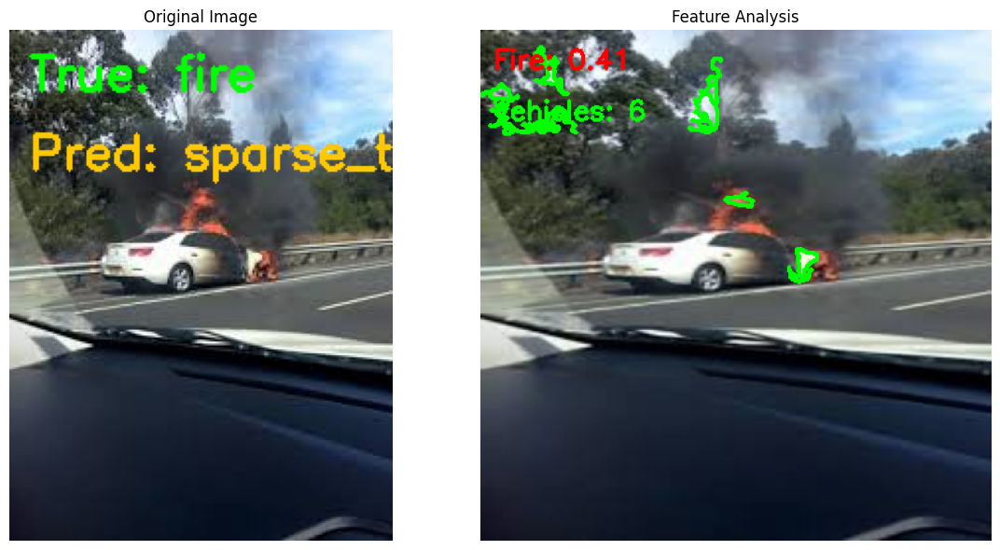


sparse_traffic:
Fire ratio: 0.24
Vehicles: 14
Prediction: sparse_traffic (Correct)


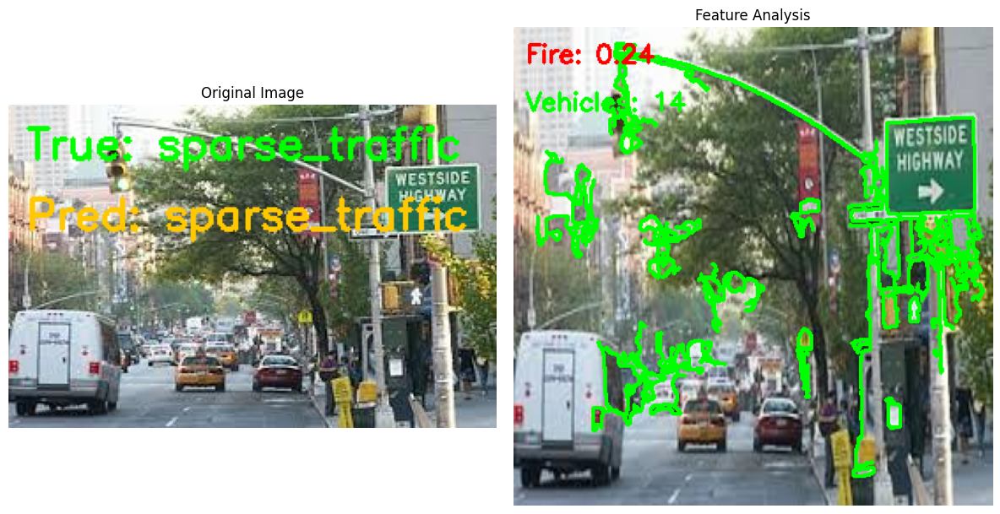


sparse_traffic:
Fire ratio: 0.36
Vehicles: 1
Prediction: accident (Wrong)


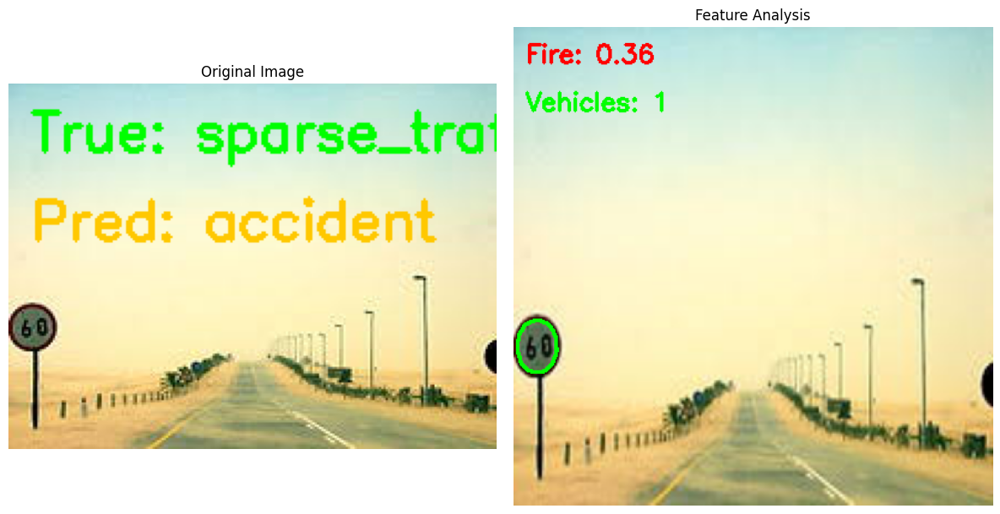


sparse_traffic:
Fire ratio: 1.03
Vehicles: 4
Prediction: sparse_traffic (Correct)


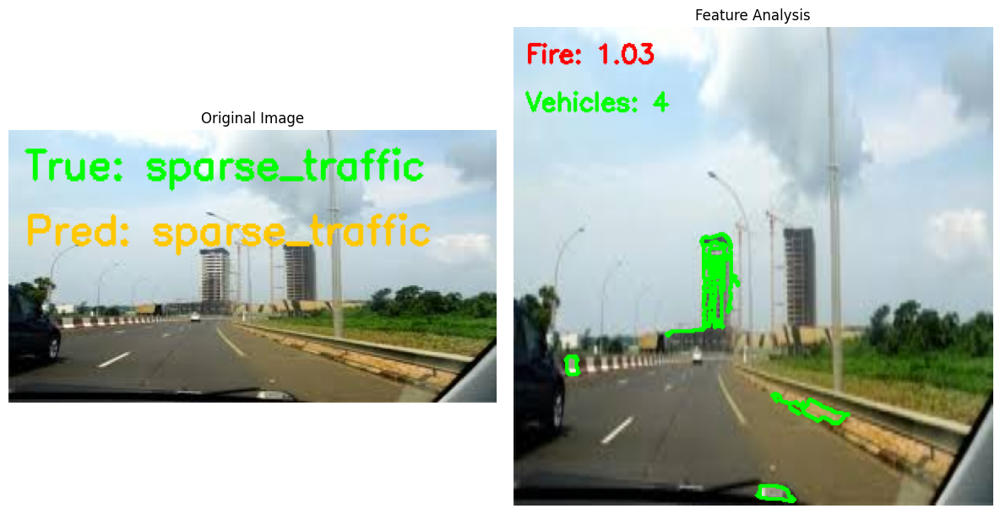


Final Accuracy: 4/12 (33.3%)


In [4]:
# classifying images
print("Traffic Incident Classification")
print("="*50)

class_features = defaultdict(list)
for class_name in CLASSES:
    class_dir = DATA_ROOT / 'test' / class_name
    if not class_dir.exists():
        print(f"Missing folder: {class_dir}")
        continue
        
    for img_file in class_dir.glob('*.*'):
        if img_file.suffix.lower() not in ('.jpg', '.jpeg', '.png'):
            continue
            
        img = cv2.imread(str(img_file))
        if img is not None:
            features = extract_features(img)
            class_features[class_name].append((img, features))

fire_threshold = np.mean([f['fire_ratio'] for c in CLASSES for _, f in class_features[c]]) * 0.8
dense_threshold = np.percentile([f['vehicle_count'] for _, f in class_features['dense_traffic']], 75) if 'dense_traffic' in class_features else 8
sparse_threshold = np.percentile([f['vehicle_count'] for _, f in class_features['sparse_traffic']], 25) if 'sparse_traffic' in class_features else 3

print(f"\nThresholds:")
print(f"Fire ratio: {fire_threshold:.2f}")
print(f"Dense vehicles: {dense_threshold:.0f}")
print(f"Sparse vehicles: {sparse_threshold:.0f}")
print("="*50)

correct = 0
total = 0
for class_name in CLASSES:
    if class_name not in class_features:
        continue
        
    for img, features in class_features[class_name][:3]:
        total += 1
        
        if features['fire_ratio'] > fire_threshold:
            pred = 'fire'
        elif features['vehicle_count'] > dense_threshold:
            pred = 'dense_traffic'
        elif features['vehicle_count'] > sparse_threshold:
            pred = 'sparse_traffic'
        else:
            pred = 'accident'
            
        if pred == class_name:
            correct += 1
        
        print(f"\n{class_name}:")
        print(f"Fire ratio: {features['fire_ratio']:.2f}")
        print(f"Vehicles: {features['vehicle_count']}")
        print(f"Prediction: {pred} ({'Correct' if pred == class_name else 'Wrong'})")
        
        show_results(img, class_name, pred, features)

if total > 0:
    print("\n" + "="*50)
    print(f"Final Accuracy: {correct}/{total} ({100*correct/total:.1f}%)")
else:
    print("\nNo images processed - check folder structure")
